In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import xgboost as xgb
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import seaborn as sns

In [2]:
df1=pd.read_csv("Corona_NLP_train.csv",encoding='ISO-8859-1')

In [3]:
df1

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative
...,...,...,...,...,...,...
41152,44951,89903,"Wellington City, New Zealand",14-04-2020,Airline pilots offering to stock supermarket s...,Neutral
41153,44952,89904,NaN,14-04-2020,Response to complaint not provided citing COVI...,Extremely Negative
41154,44953,89905,NaN,14-04-2020,You know itÂs getting tough when @KameronWild...,Positive
41155,44954,89906,NaN,14-04-2020,Is it wrong that the smell of hand sanitizer i...,Neutral


In [4]:
df2=pd.read_csv("Corona_NLP_test.csv",encoding='ISO-8859-1')

In [5]:
df2

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,1,44953,NYC,02-03-2020,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative
1,2,44954,"Seattle, WA",02-03-2020,When I couldn't find hand sanitizer at Fred Me...,Positive
2,3,44955,NaN,02-03-2020,Find out how you can protect yourself and love...,Extremely Positive
3,4,44956,Chicagoland,02-03-2020,#Panic buying hits #NewYork City as anxious sh...,Negative
4,5,44957,"Melbourne, Victoria",03-03-2020,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral
...,...,...,...,...,...,...
3793,3794,48746,Israel ??,16-03-2020,Meanwhile In A Supermarket in Israel -- People...,Positive
3794,3795,48747,"Farmington, NM",16-03-2020,Did you panic buy a lot of non-perishable item...,Negative
3795,3796,48748,"Haverford, PA",16-03-2020,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral
3796,3797,48749,NaN,16-03-2020,Gov need to do somethings instead of biar je r...,Extremely Negative


In [6]:
result=pd.concat([df1,df2],ignore_index=True)

In [7]:
result

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative
...,...,...,...,...,...,...
44950,3794,48746,Israel ??,16-03-2020,Meanwhile In A Supermarket in Israel -- People...,Positive
44951,3795,48747,"Farmington, NM",16-03-2020,Did you panic buy a lot of non-perishable item...,Negative
44952,3796,48748,"Haverford, PA",16-03-2020,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral
44953,3797,48749,NaN,16-03-2020,Gov need to do somethings instead of biar je r...,Extremely Negative


In [8]:
result=result.drop(['UserName','ScreenName','Location','TweetAt'],axis=1)


In [9]:
result

,OriginalTweet,Sentiment
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,advice Talk to your neighbours family to excha...,Positive
2,Coronavirus Australia: Woolworths to give elde...,Positive
3,My food stock is not the only one which is emp...,Positive
4,"Me, ready to go at supermarket during the #COV...",Extremely Negative
...,...,...
44950,Meanwhile In A Supermarket in Israel -- People...,Positive
44951,Did you panic buy a lot of non-perishable item...,Negative
44952,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral
44953,Gov need to do somethings instead of biar je r...,Extremely Negative


In [10]:
sia = SentimentIntensityAnalyzer()


In [11]:
res = {}
for i, row in tqdm(result.iterrows(), total=len(result)):
    text = row['OriginalTweet']
    res = sia.polarity_scores(text)
    print(text)
    print(res)

  0%|          | 0/44955 [00:00<?, ?it/s]

@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/iFz9FAn2Pa and https://t.co/xX6ghGFzCC and https://t.co/I2NlzdxNo8
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
advice Talk to your neighbours family to exchange phone numbers create contact list with phone numbers of neighbours schools employer chemist GP set up online shopping accounts if poss adequate supplies of regular meds but not over order
{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'compound': 0.25}
Coronavirus Australia: Woolworths to give elderly, disabled dedicated shopping hours amid COVID-19 outbreak https://t.co/bInCA9Vp8P
{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'compound': 0.4588}





#COVID19france #COVID_19 #COVID19 #coronavirus #confinement #Confinementotal #ConfinementGeneral https://t.co/zrlG0Z520j
{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.8731}




#CoronavirusFrance #restezchezvous #StayAtHome #confinement https://t.co/usmuaLq72n
{'neg': 0.079, 'neu': 0.713, 'pos': 0.208, 'compound': 0.7161}
As new

In [12]:
result['Sentiment Scores'] = result['OriginalTweet'].apply(lambda text: sia.polarity_scores(text))


In [13]:
result

,OriginalTweet,Sentiment,Sentiment Scores
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
1,advice Talk to your neighbours family to excha...,Positive,"{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'comp..."
2,Coronavirus Australia: Woolworths to give elde...,Positive,"{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'comp..."
3,My food stock is not the only one which is emp...,Positive,"{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'comp..."
4,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"{'neg': 0.079, 'neu': 0.713, 'pos': 0.208, 'co..."
...,...,...,...
44950,Meanwhile In A Supermarket in Israel -- People...,Positive,"{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'comp..."
44951,Did you panic buy a lot of non-perishable item...,Negative,"{'neg': 0.09, 'neu': 0.847, 'pos': 0.063, 'com..."
44952,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
44953,Gov need to do somethings instead of biar je r...,Extremely Negative,"{'neg': 0.241, 'neu': 0.692, 'pos': 0.067, 'co..."


In [14]:
result.loc[0]['Sentiment Scores']

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [15]:
result['Compound Sentiment Score'] = result['Sentiment Scores'].apply(lambda scores: scores['compound'])
result['pos'] = result['Sentiment Scores'].apply(lambda scores: scores['pos'])
result['neg'] = result['Sentiment Scores'].apply(lambda scores: scores['neg'])
result['neu'] = result['Sentiment Scores'].apply(lambda scores: scores['neu'])


In [16]:
result

,OriginalTweet,Sentiment,Sentiment Scores,Compound Sentiment Score,pos,neg,neu
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,0.000,0.000,1.000
1,advice Talk to your neighbours family to excha...,Positive,"{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'comp...",0.2500,0.077,0.000,0.923
2,Coronavirus Australia: Woolworths to give elde...,Positive,"{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'comp...",0.4588,0.188,0.000,0.812
3,My food stock is not the only one which is emp...,Positive,"{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'comp...",0.8731,0.223,0.000,0.777
4,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"{'neg': 0.079, 'neu': 0.713, 'pos': 0.208, 'co...",0.7161,0.208,0.079,0.713
...,...,...,...,...,...,...,...
44950,Meanwhile In A Supermarket in Israel -- People...,Positive,"{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'comp...",0.5574,0.194,0.000,0.806
44951,Did you panic buy a lot of non-perishable item...,Negative,"{'neg': 0.09, 'neu': 0.847, 'pos': 0.063, 'com...",-0.2500,0.063,0.090,0.847
44952,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,0.000,0.000,1.000
44953,Gov need to do somethings instead of biar je r...,Extremely Negative,"{'neg': 0.241, 'neu': 0.692, 'pos': 0.067, 'co...",-0.8205,0.067,0.241,0.692


In [17]:
result.head()
from sklearn import preprocessing 
label_encoder = preprocessing.LabelEncoder()
result['Emotion']= label_encoder.fit_transform(result['Sentiment'])

In [18]:
result

,OriginalTweet,Sentiment,Sentiment Scores,Compound Sentiment Score,pos,neg,neu,Emotion
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,0.000,0.000,1.000,3
1,advice Talk to your neighbours family to excha...,Positive,"{'neg': 0.0, 'neu': 0.923, 'pos': 0.077, 'comp...",0.2500,0.077,0.000,0.923,4
2,Coronavirus Australia: Woolworths to give elde...,Positive,"{'neg': 0.0, 'neu': 0.812, 'pos': 0.188, 'comp...",0.4588,0.188,0.000,0.812,4
3,My food stock is not the only one which is emp...,Positive,"{'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'comp...",0.8731,0.223,0.000,0.777,4
4,"Me, ready to go at supermarket during the #COV...",Extremely Negative,"{'neg': 0.079, 'neu': 0.713, 'pos': 0.208, 'co...",0.7161,0.208,0.079,0.713,0
...,...,...,...,...,...,...,...,...
44950,Meanwhile In A Supermarket in Israel -- People...,Positive,"{'neg': 0.0, 'neu': 0.806, 'pos': 0.194, 'comp...",0.5574,0.194,0.000,0.806,4
44951,Did you panic buy a lot of non-perishable item...,Negative,"{'neg': 0.09, 'neu': 0.847, 'pos': 0.063, 'com...",-0.2500,0.063,0.090,0.847,2
44952,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,0.000,0.000,1.000,3
44953,Gov need to do somethings instead of biar je r...,Extremely Negative,"{'neg': 0.241, 'neu': 0.692, 'pos': 0.067, 'co...",-0.8205,0.067,0.241,0.692,0


In [19]:
X = result[['Compound Sentiment Score','pos','neg','neu']]
Y = result['Emotion']

In [20]:
X

,Compound Sentiment Score,pos,neg,neu
0,0.0000,0.000,0.000,1.000
1,0.2500,0.077,0.000,0.923
2,0.4588,0.188,0.000,0.812
3,0.8731,0.223,0.000,0.777
4,0.7161,0.208,0.079,0.713
...,...,...,...,...
44950,0.5574,0.194,0.000,0.806
44951,-0.2500,0.063,0.090,0.847
44952,0.0000,0.000,0.000,1.000
44953,-0.8205,0.067,0.241,0.692


In [21]:
Y

0        3
1        4
2        4
3        4
4        0
        ..
44950    4
44951    2
44952    3
44953    0
44954    1
Name: Emotion, Length: 44955, dtype: int32

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.15, random_state=13)


Accuracy: 92.70462633451957


<AxesSubplot:>

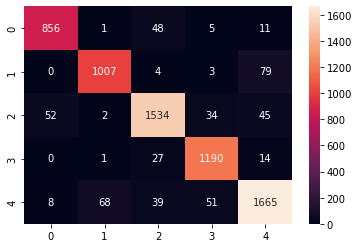

In [24]:
RForest_clf = RandomForestClassifier(n_estimators = 100)
RForest_clf.fit(X_train, y_train)
y_pred = RForest_clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)*100
print(f'Accuracy: {accuracy}')
cm=confusion_matrix(y_test,y_pred)
cm
sns.heatmap(data=cm,annot=True,fmt='d')

Accuracy: 89.45729537366547


<AxesSubplot:>

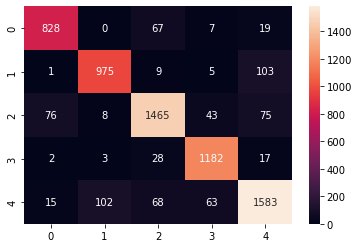

In [25]:
model = DecisionTreeClassifier(random_state = 13)
model.fit(X_train, y_train)
predicted = model.predict(X_test)
accuracy = accuracy_score(predicted, y_test)*100
print(f'Accuracy: {accuracy}')
cm=confusion_matrix(y_test,predicted)
cm
sns.heatmap(data=cm,annot=True,fmt='d')

Accuracy: 93.69810201660735


<AxesSubplot:>

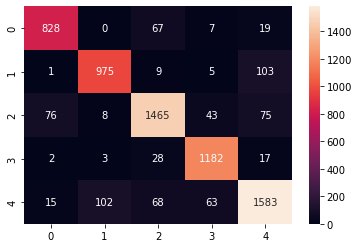

In [26]:
xgb_classifier = xgb.XGBClassifier()
xgb_classifier.fit(X_train,y_train)
y_pred = xgb_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)*100
print(f'Accuracy: {accuracy}')
cm=confusion_matrix(y_test,predicted)
cm
sns.heatmap(data=cm,annot=True,fmt='d')

Accuracy: 90.27283511269276


C:\Users\himanshu\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


<AxesSubplot:>

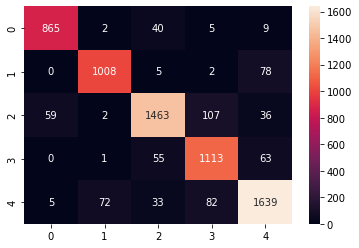

In [27]:
model = LogisticRegression()
model.fit(X_train, y_train)
predicted = model.predict(X_test)
accuracy = accuracy_score(predicted, y_test)*100
print(f'Accuracy: {accuracy}')
cm=confusion_matrix(y_test,predicted)
cm
sns.heatmap(data=cm,annot=True,fmt='d')

Accuracy: 92.7491103202847


<AxesSubplot:>

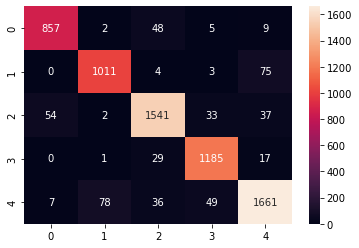

In [28]:
model = KNeighborsClassifier()
model.fit(X_train, y_train)
predicted = model.predict(X_test)
accuracy = accuracy_score(predicted, y_test)*100
print(f'Accuracy: {accuracy}')
cm=confusion_matrix(y_test,predicted)
cm
sns.heatmap(data=cm,annot=True,fmt='d')